# Electricity Demand Forecasting

<p>
  This project aims to forecast average hourly energy demand in New York City using historical data from 2012 to 2017, incorporating both past energy demand records and weather variables such as temperature and precipitation.
</p>

<p>
  Accurate energy demand forecasting is essential for:
  <ul>
    <li>Load balancing across the power grid</li>
    <li>Efficient energy distribution</li>
    <li>Reducing energy waste and operational costs</li>
    <li>Supporting smart grid and renewable energy integration</li>
  </ul>
</p>

<p>
  To achieve this, we explored and compared a range of modeling approaches:
  <ul>
    <li><strong>Traditional statistical models:</strong> ARIMA, Exponential Smoothing (ETS)</li>
    <li><strong>Machine learning models:</strong> Random Forest Regressor (RF)</li>
    <li><strong>Deep learning models:</strong> Long Short-Term Memory (LSTM) networks</li>
  </ul>
</p>

<p>
  Through this comparative study, we aim to identify which models best capture the temporal patterns and external dependencies in the data, and how each performs in terms of forecasting accuracy and generalization.
</p>

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [6]:
plt.rcParams['figure.figsize'] = (10,4)

In [7]:
#Reading the csv file
df = pd.read_csv(r'C:\Users\HP LAPTOP\Desktop\nyc.csv')
df

,timeStamp,demand,precip,temp
0,2012-01-01 00:00:00,4937.5,0.0000,46.13
1,2012-01-01 01:00:00,4752.1,0.0000,45.89
2,2012-01-01 02:00:00,4542.6,0.0000,45.04
3,2012-01-01 03:00:00,4357.7,0.0000,45.03
4,2012-01-01 04:00:00,4275.5,0.0000,42.61
...,...,...,...,...
49200,2017-08-12 02:00:00,NaN,0.0000,70.84
49201,2017-08-12 03:00:00,NaN,0.0000,70.57
49202,2017-08-12 04:00:00,NaN,0.0000,69.89
49203,2017-08-12 05:00:00,NaN,0.0000,68.59


## Exploratory Data Analysis

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49205 entries, 0 to 49204
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timeStamp  49205 non-null  object 
 1   demand     49124 non-null  float64
 2   precip     48975 non-null  float64
 3   temp       49019 non-null  float64
dtypes: float64(3), object(1)
memory usage: 1.5+ MB


<p>Using <code>df.info(),</code> we observe that the dataset contains four columns:</p>

<ul>
  <li><strong>timeStamp</strong>: Object type, representing the date and time of each observation</li>
  <li><strong>demand</strong>: Float, representing energy demand in kilowatts</li>
  <li><strong>precip</strong>: Float, indicating precipitation levels</li>
  <li><strong>temp</strong>: Float, representing temperature in Fahrenheit</li>
</ul>

<p>The <code>timeStamp</code> column is currently stored as an object and needs to be converted into a proper datetime format to enable effective time series analysis.</p>

<p>Additionally, <code>df.info()</code> helps identify the presence of any missing (null) values in the dataset, which we will handle during the data cleaning stage.</p>

In [11]:
#Updating column names for better understanding
df.columns = ['timeStamp','demand','precipitation','temperature']


In [12]:
#Extracting year and month from datetime column
df['timeStamp'] = pd.to_datetime(df['timeStamp'])
df['year'] = df['timeStamp'].dt.year
df['month'] = df['timeStamp'].dt.month

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49205 entries, 0 to 49204
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   timeStamp      49205 non-null  datetime64[ns]
 1   demand         49124 non-null  float64       
 2   precipitation  48975 non-null  float64       
 3   temperature    49019 non-null  float64       
 4   year           49205 non-null  int32         
 5   month          49205 non-null  int32         
dtypes: datetime64[ns](1), float64(3), int32(2)
memory usage: 1.9 MB


In [14]:
#timeStamp has been converted into datetime type
df.dtypes

timeStamp        datetime64[ns]
demand                  float64
precipitation           float64
temperature             float64
year                      int32
month                     int32
dtype: object

In [15]:
#Printing number of rows and columns
print('Rows: ', df.shape[0])
print('Columns: ', df.shape[1])

Rows:  49205
Columns:  6


In [16]:
#Printing names of columns
df.columns.tolist()

['timeStamp', 'demand', 'precipitation', 'temperature', 'year', 'month']

In [17]:
#Null values analysis
df.isnull().sum()

timeStamp          0
demand            81
precipitation    230
temperature      186
year               0
month              0
dtype: int64

<p> We observe that demand, precipitation, temperature columns contain 81, 230, 186 nulls respectively.</p>

In [19]:
#Unique values in each column
df.nunique()

timeStamp        49205
demand           40972
precipitation     1004
temperature       7580
year                 6
month               12
dtype: int64

<p><b>This analysis reveals a few key insights:
<ul>
<li>The timeStamp column has 49,205 unique values, confirming that each timestamp is unique and the data does not contain duplicate time entries.</li>
<li>The dataset covers 6 years and 12 months, indicating a complete monthly cycle for each year.
<li>The high number of unique values in the demand, temperature, and precipitation columns suggests a continuous range of values, suitable for time series forecasting.</li>
</ul>
</b></p>

#### Statistical summary of the data

In [22]:
df.describe()

,timeStamp,demand,precipitation,temperature,year,month
count,49205,49124.000000,48975.000000,49019.000000,49205.000000,49205.000000
mean,2014-10-22 02:19:36.977949440,6067.447361,0.003522,55.520428,2014.326633,6.270623
min,2012-01-01 00:00:00,2859.600000,0.000000,0.330000,2012.000000,1.000000
25%,2013-05-27 13:00:00,5133.862250,0.000000,41.415000,2013.000000,3.000000
50%,2014-10-22 02:00:00,6020.071000,0.000000,56.260000,2014.000000,6.000000
75%,2016-03-17 16:00:00,6684.300000,0.000000,70.540000,2016.000000,9.000000
max,2017-08-12 06:00:00,11456.000000,0.905100,97.260000,2017.000000,12.000000
std,NaN,1285.607657,0.022841,17.704848,1.630189,3.407905


<ul>
    <li><b>Energy demand shows high variability from 2859 to 11,456 with a large standard deviation 1285, indicating strong seasonal or usage fluctuations.</li>
<li><b>Temperature ranges widely from 0.33 to 97.26, suggesting both extreme winter and summer conditions, likely influencing demand.
️<li>Precipitation is mostly low or absent, with few heavy rainfall days (max = 1.51), meaning it may have limited but occasional impact.</li></ul>

In [24]:
#Setting timestamp as index
df = df.set_index('timeStamp')
df= df.sort_index()

In [25]:
df.index

DatetimeIndex(['2012-01-01 00:00:00', '2012-01-01 01:00:00',
               '2012-01-01 02:00:00', '2012-01-01 03:00:00',
               '2012-01-01 04:00:00', '2012-01-01 05:00:00',
               '2012-01-01 06:00:00', '2012-01-01 07:00:00',
               '2012-01-01 08:00:00', '2012-01-01 09:00:00',
               ...
               '2017-08-11 21:00:00', '2017-08-11 22:00:00',
               '2017-08-11 23:00:00', '2017-08-12 00:00:00',
               '2017-08-12 01:00:00', '2017-08-12 02:00:00',
               '2017-08-12 03:00:00', '2017-08-12 04:00:00',
               '2017-08-12 05:00:00', '2017-08-12 06:00:00'],
              dtype='datetime64[ns]', name='timeStamp', length=49205, freq=None)

In [26]:
df.head()

,demand,precipitation,temperature,year,month
timeStamp,,,,,
2012-01-01 00:00:00,4937.5,0.0,46.13,2012,1
2012-01-01 01:00:00,4752.1,0.0,45.89,2012,1
2012-01-01 02:00:00,4542.6,0.0,45.04,2012,1
2012-01-01 03:00:00,4357.7,0.0,45.03,2012,1
2012-01-01 04:00:00,4275.5,0.0,42.61,2012,1


In [27]:
pm_data = df['demand']
pm_data.head()

timeStamp
2012-01-01 00:00:00    4937.5
2012-01-01 01:00:00    4752.1
2012-01-01 02:00:00    4542.6
2012-01-01 03:00:00    4357.7
2012-01-01 04:00:00    4275.5
Name: demand, dtype: float64

### Data Visualisation

In [29]:
#visualising the distribution of 'demand' data

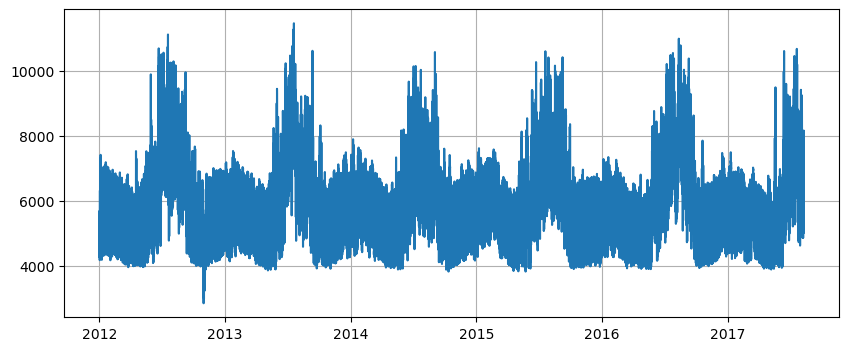

In [30]:
plt.plot(pm_data)
plt.grid(True)

In [31]:
#Exploring the distribution of demand variable with slicer

import plotly.express as px
fig = px.line(df, df.index, df['demand'], title = 'demand with slider', width=1000, height = 600)

fig.update_xaxes(rangeslider_visible = True, 
                 rangeselector = dict(
                     buttons = list([
                         dict(count=1, label='1y', step='year'),
                         dict(count=2, label='2y', step='year'),
                         dict(count=3, label='3y', step='year'),
                         dict(count=4, label='4y', step='year')
                     ])
                 )
    
)
fig.show()

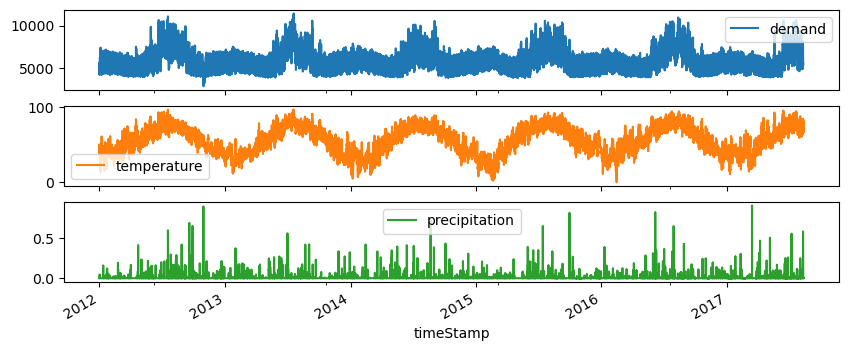

In [32]:
multi_data = df[['demand','temperature', 'precipitation']]
multi_data.plot(subplots=True)
plt.show()

<p><b>From the above plots, we can conclude that there are clear and consistent seasonal patterns in energy demand across the years. The demand typically peaks between June and August, which likely corresponds to increased air conditioning usage during the summer months. Following this peak, the demand begins to decline and returns to lower levels similar to those observed from January to May, indicating a strong seasonal pattern in the energy demand.</b></p>

In [34]:
df.loc['2012':'2016'][['month','demand']].groupby('month').describe()

demand                                                            \
        count         mean          std       min         25%       50%   
month                                                                     
1      3716.0  5877.604716   857.870596  4147.600  5139.98975  5950.450   
2      3408.0  5881.684056   828.865212  4180.100  5171.65650  5986.075   
3      3714.0  5577.793900   802.657715  3932.758  4874.58150  5639.750   
4      3599.0  5316.965636   797.458778  3851.633  4561.35000  5352.000   
5      3720.0  5641.212967  1089.832378  3833.092  4779.77500  5621.250   
6      3591.0  6584.739283  1298.483961  3925.400  5592.90400  6517.575   
7      3720.0  7687.632422  1382.549870  4519.900  6598.61875  7648.379   
8      3719.0  7333.303429  1278.430865  4593.600  6311.24600  7329.308   
9      3600.0  6493.735871  1344.275927  3929.100  5531.95000  6414.450   
10     3717.0  5449.867636   933.355592  2859.600  4608.23300  5465.558   
11     3600.0  5406.906685   823.992393  3236.800  4636.35825  5453.100   
12     3720.0  5641.314807   825.289502  3978.750  4881.25000  5734.879   

                              
              75%        max  
month                         
1      6589.58775   7895.500  
2      6584.09350   7582.431  
3      6286.87500   7243.400  
4      6065.26650   7531.500  
5      6339.55000   9887.900  
6      7473.02100  10685.400  
7      8713.09400  11456.000  
8      8241.61650  10983.130  
9      7289.24975  10610.900  
10     6212.70000   8320.800  
11     6167.00600   7131.600  
12     6355.98125   7494.900

<p><b>From the above table, we can again observe that the highest mean, standard deviation, and maximum values of energy demand occur during the months of June, July, August and September. This statistical summary is similar to the insights gained from the earlier plot, confirming a seasonal rise in demand during the summer months in New York City.<b></p>


In [36]:
df['2012':'2017'][['month','demand','temperature','precipitation']].groupby('month').agg({'demand':['min','max','mean'], 
                                                                          'temperature':['min','max','mean'],
                                                                          'precipitation':['min','max','mean']})

demand                         temperature                    \
            min        max         mean         min    max       mean   
month                                                                   
1      4147.600   7895.500  5854.381531        5.06  62.00  33.417550   
2      4076.742   7582.431  5837.286543        0.33  69.66  34.458448   
3      3932.758   7243.400  5591.660999       13.00  75.96  41.420610   
4      3851.633   7531.500  5302.886698       26.08  86.22  52.600204   
5      3833.092   9887.900  5604.686695       41.66  93.34  62.543994   
6      3925.400  10685.400  6586.952404       50.20  95.82  71.336321   
7      4519.900  11456.000  7624.638783       59.32  97.26  77.598531   
8      4593.600  10983.130  7312.922794       60.64  94.86  75.546591   
9      3929.100  10610.900  6493.735871       49.29  92.72  69.555256   
10     2859.600   8320.800  5449.867636       33.45  84.80  58.665013   
11     3236.800   7131.600  5406.906685       22.48  71.47  47.203346   
12     3978.750   7494.900  5641.314807       16.71  68.82  41.372727   

      precipitation                    
                min     max      mean  
month                                  
1               0.0  0.3888  0.003331  
2               0.0  0.4193  0.003188  
3               0.0  0.9051  0.003427  
4               0.0  0.4675  0.003326  
5               0.0  0.5046  0.003839  
6               0.0  0.8223  0.004713  
7               0.0  0.6500  0.003620  
8               0.0  0.7198  0.003458  
9               0.0  0.8136  0.003348  
10              0.0  0.8936  0.002777  
11              0.0  0.3353  0.002632  
12              0.0  0.3229  0.004437

<p><b>From the above table, we observe that during the months of June to September, both energy demand and temperatures are relatively high. 
Precipitation and demand does not seem to have any correlation or pattern.</b></p>

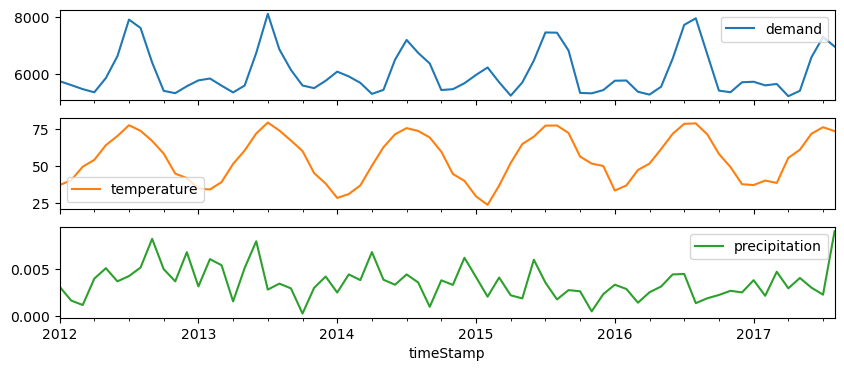

In [38]:
multi_data.resample('M').mean().plot(subplots=True)
plt.show()

<p>
<b>From the monthly resampled line plots, it is evident that both <strong>demand</strong> and <strong>temperature</strong> exhibit clear and consistent seasonal patterns, peaking during the summer months i.e. June to September. This indicates a strong relationship between temperature and energy demand, likely driven by increased usage of cooling systems. In contrast, <strong>precipitation</strong> does not show any noticeable or repeating trend over the years, suggesting it does not significantly influence the energy demand in New York City.
</b></p>

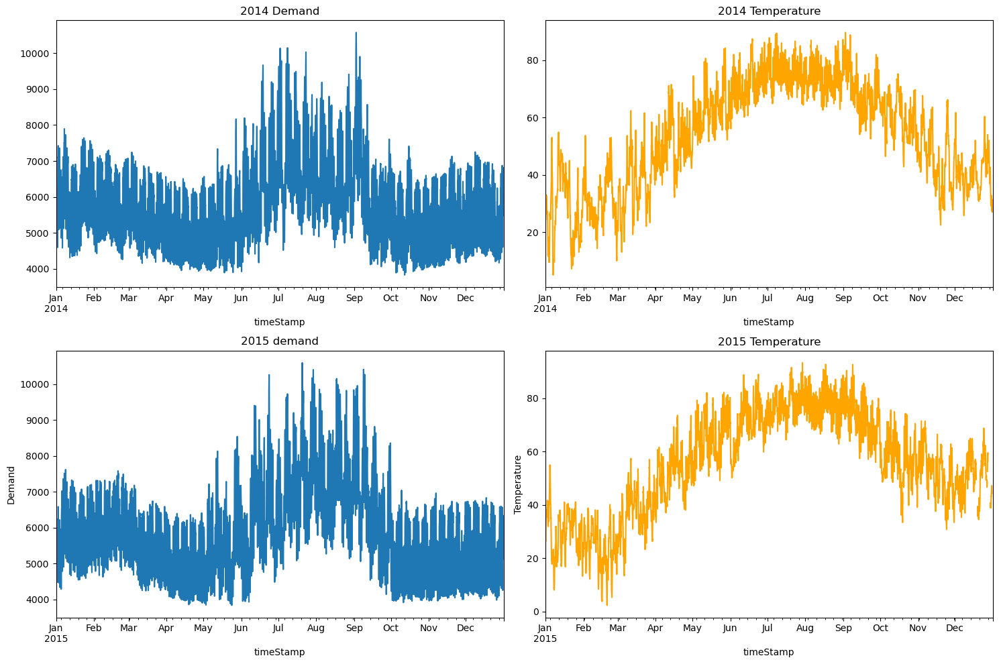

In [40]:
#Visualising temperature and demand for year 2014 and 2015 to understand their correlation.

df_2014 = df.loc['2014']
df_2015 = df.loc['2015']
pm_data_2014 = df_2014[['demand', 'temperature']]
pm_data_2015 = df_2015[['demand', 'temperature']]

fig, ax = plt.subplots(2, 2, figsize=(15, 10))
pm_data_2014['demand'].plot(ax=ax[0, 0], title='2014 Demand')

pm_data_2014['temperature'].plot(ax=ax[0, 1], title='2014 Temperature', color='orange')

pm_data_2015['demand'].plot(ax=ax[1, 0], title='2015 demand')
ax[1, 0].set_ylabel('Demand')

pm_data_2015['temperature'].plot(ax=ax[1, 1], title='2015 Temperature', color='orange')
ax[1, 1].set_ylabel('Temperature')
plt.tight_layout()
plt.show()

<p><b>The above graphs compare the temperature and energy demand for the years 2014 and 2015. We observe a clear pattern where both temperature and demand are significantly higher during the months of June to September. This aligns with our earlier findings from the summary table.</b></p>


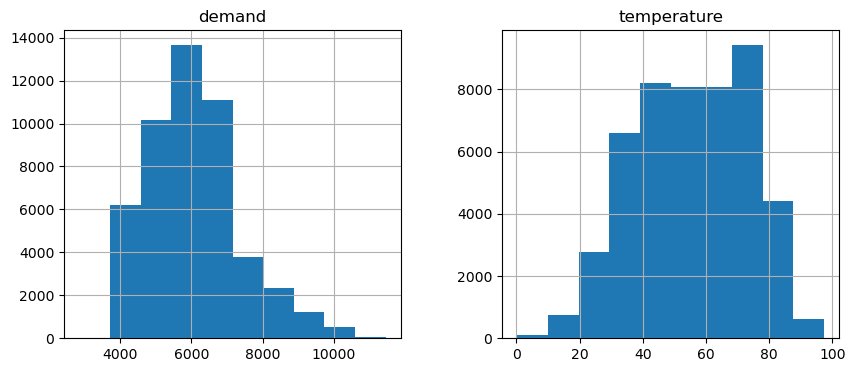

In [42]:
df[['demand', 'temperature']].hist()
plt.show()

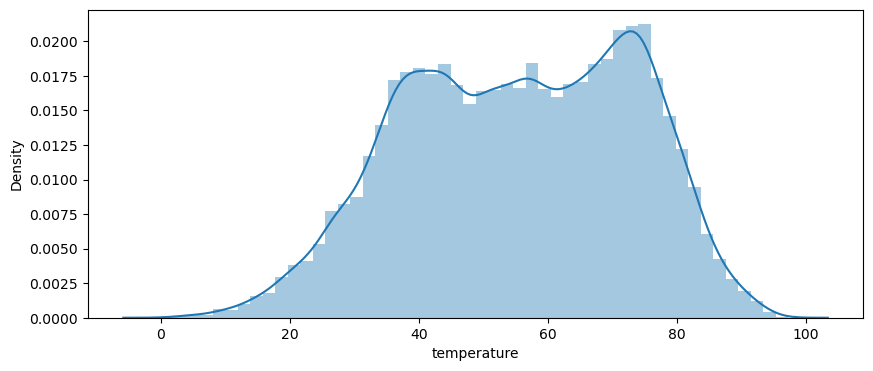

In [43]:
sns.distplot(df['temperature'])
plt.show()

<p><b>
The above histograms display the distributions of hourly energy <strong>demand</strong> and <strong>temperature</strong> from 2012 to 2017. The demand histogram is slightly <strong>right-skewed</strong>, indicating that most of the values lie between 4,000 and 8,000 MWh. This suggests typical consumption behavior with occasional peaks, likely during extreme weather conditions. The temperature distribution appears to be <strong>bimodal or slightly uniform</strong> within a moderate range (roughly 30°F to 80°F), reflecting seasonal variations in New York City's climate. 
</b></p>

### Lag plots

It plots the value of the time series at time t on the x-axis against the value at time t + lag on the y-axis.

In [47]:
df['demand']

timeStamp
2012-01-01 00:00:00    4937.5
2012-01-01 01:00:00    4752.1
2012-01-01 02:00:00    4542.6
2012-01-01 03:00:00    4357.7
2012-01-01 04:00:00    4275.5
                        ...  
2017-08-12 02:00:00       NaN
2017-08-12 03:00:00       NaN
2017-08-12 04:00:00       NaN
2017-08-12 05:00:00       NaN
2017-08-12 06:00:00       NaN
Name: demand, Length: 49205, dtype: float64

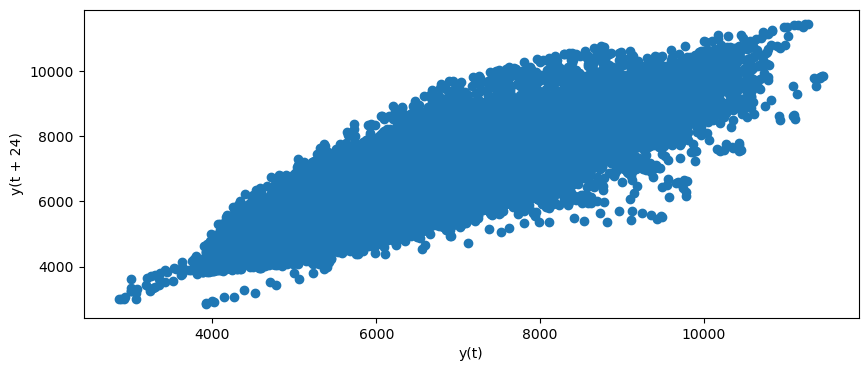

In [48]:
pd.plotting.lag_plot(df['demand'], lag=24) #24 hours
plt.show()

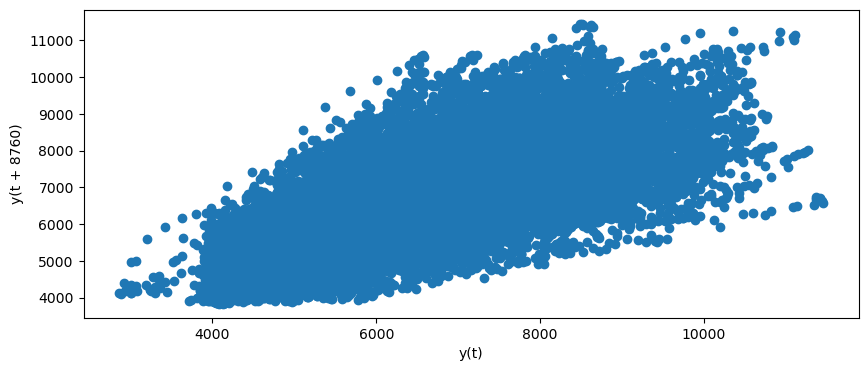

In [49]:
pd.plotting.lag_plot(df['demand'], lag=8760) #1 year
plt.show()

<p><b>
The lag plots with a lag of 24 hours and 1 year shows a visible linear pattern, indicating a strong autocorrelation in the energy demand data. This suggests that past values of demand are good predictors of future values, making time series forecasting models, such as ARIMA and LSTM, appropriate for this dataset.
</b></p>

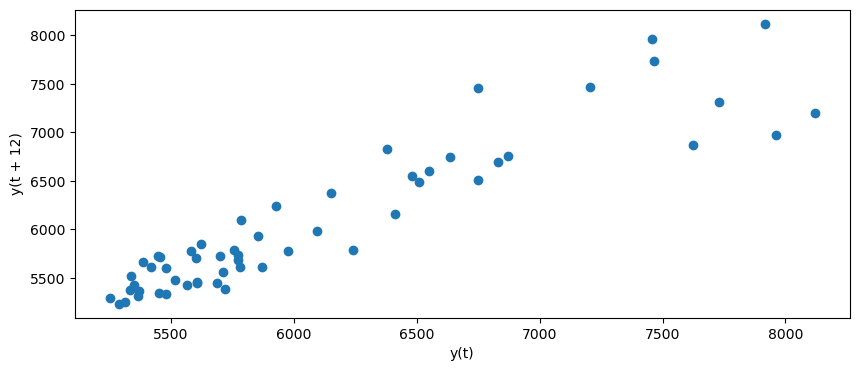

In [51]:
#Plotting average monthly demand at time t and at time t+12 months

pd.plotting.lag_plot(multi_data['demand'].resample('M').mean(), lag=12)
plt.show()

<p><b>This indicates a strong positive correlation between demand in a month and the same month one year later.</b></p>
<p><b>There is clear evidence of annual seasonality in energy demand.
This means past yearly patterns are highly predictive of future years' behavior.</p></b>

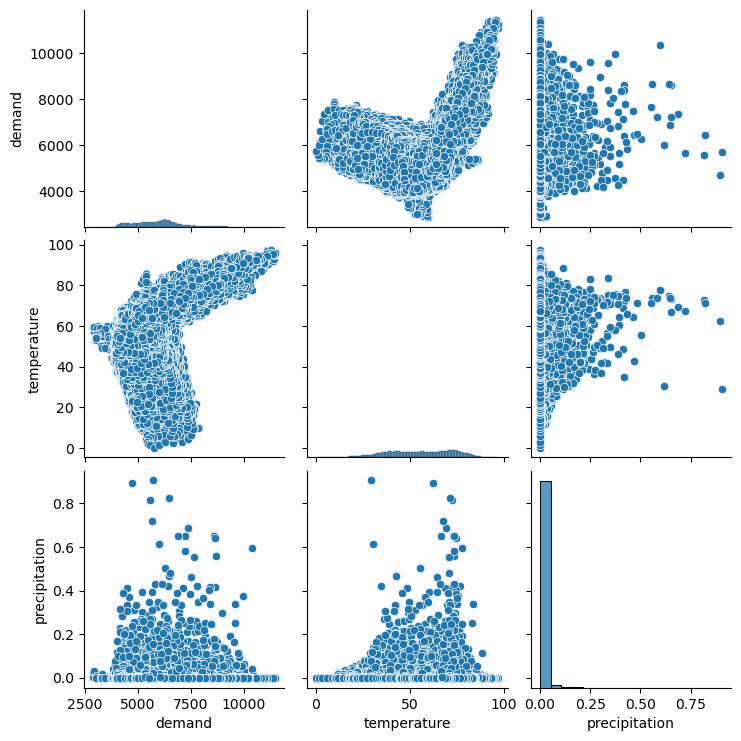

In [53]:
sns.pairplot(df[['demand','temperature', 'precipitation']])
plt.show()
                 

In [54]:
corr = df.corr(method='pearson')
corr

,demand,precipitation,temperature,year,month
demand,1.000000,0.011427,0.510770,-0.007716,0.066501
precipitation,0.011427,1.000000,-0.001429,-0.019162,0.000560
temperature,0.510770,-0.001429,1.000000,0.002617,0.343177
year,-0.007716,-0.019162,0.002617,1.000000,-0.120534
month,0.066501,0.000560,0.343177,-0.120534,1.000000


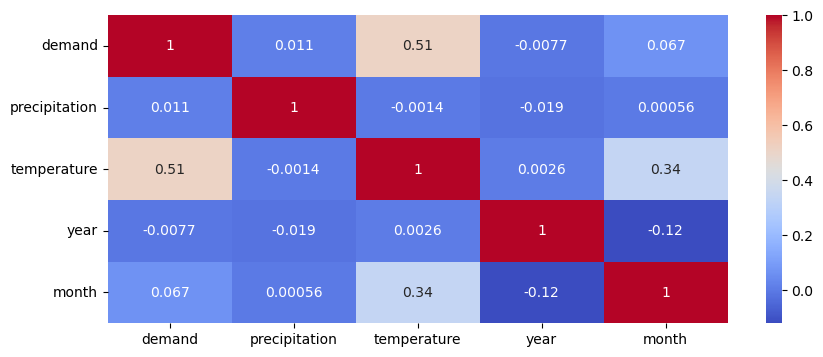

In [55]:
sns.heatmap(corr, annot= True, cmap='coolwarm')
plt.show()

<p><b>Through correlation matrix, we again observe a positive correlation between demand and temperature.</b></p>


### Handling missing values

In [58]:
df[df['demand'].isnull()]

,demand,precipitation,temperature,year,month
timeStamp,,,,,
2012-03-11 02:00:00,NaN,0.0000,37.78,2012,3
2013-03-10 02:00:00,NaN,0.0000,38.18,2013,3
2014-03-09 02:00:00,NaN,0.0000,40.86,2014,3
2015-03-08 02:00:00,NaN,0.0000,36.96,2015,3
2015-03-11 11:00:00,NaN,0.0000,49.95,2015,3
...,...,...,...,...,...
2017-08-12 02:00:00,NaN,0.0000,70.84,2017,8
2017-08-12 03:00:00,NaN,0.0000,70.57,2017,8
2017-08-12 04:00:00,NaN,0.0000,69.89,2017,8


In [59]:
df[df['temperature'].isnull()]

,demand,precipitation,temperature,year,month
timeStamp,,,,,
2015-08-25 19:00:00,9020.684,NaN,NaN,2015,8
2015-09-18 11:00:00,8219.750,NaN,NaN,2015,9
2015-10-08 13:00:00,6493.725,NaN,NaN,2015,10
2015-10-19 12:00:00,6234.450,NaN,NaN,2015,10
2015-10-19 23:00:00,5029.983,NaN,NaN,2015,10
...,...,...,...,...,...
2017-02-21 05:00:00,4550.708,NaN,NaN,2017,2
2017-02-21 14:00:00,6182.317,NaN,NaN,2017,2
2017-02-21 19:00:00,6280.158,NaN,NaN,2017,2


<p>Filling null values of demand and temperature using forward ffill method. It fills the missing values by carrying forward the last known non-null value.</p>

In [61]:
df['demand'] = df['demand'].fillna(method='ffill')
df[['demand']]

,demand
timeStamp,
2012-01-01 00:00:00,4937.500
2012-01-01 01:00:00,4752.100
2012-01-01 02:00:00,4542.600
2012-01-01 03:00:00,4357.700
2012-01-01 04:00:00,4275.500
...,...
2017-08-12 02:00:00,5534.683
2017-08-12 03:00:00,5534.683
2017-08-12 04:00:00,5534.683


In [62]:
df['temperature'] = df['temperature'].fillna(method='ffill')
df[['temperature']]

,temperature
timeStamp,
2012-01-01 00:00:00,46.13
2012-01-01 01:00:00,45.89
2012-01-01 02:00:00,45.04
2012-01-01 03:00:00,45.03
2012-01-01 04:00:00,42.61
...,...
2017-08-12 02:00:00,70.84
2017-08-12 03:00:00,70.57
2017-08-12 04:00:00,69.89


### Resampling

In [64]:
from statsmodels.tsa.seasonal import seasonal_decompose

df_1 = df.copy()
df_1 = df_1[['demand', 'temperature']].resample('M').mean() 

In [65]:
df_1

,demand,temperature
timeStamp,,
2012-01-31,5757.495833,37.174288
2012-02-29,5622.331609,40.448046
2012-03-31,5478.582661,49.607917
2012-04-30,5368.945833,54.255903
2012-05-31,5867.896102,64.188078
...,...,...
2017-04-30,5234.711447,55.621764
2017-05-31,5420.456899,61.115457
2017-06-30,6597.990346,71.962625


In [66]:
df_1[['demand','temperature']].corr()

,demand,temperature
demand,1.000000,0.676098
temperature,0.676098,1.000000


### Smoothing techniques

<p>smoothing techniques reduces noise and enhance patterns in the data. These methods help reveal the underlying trend and seasonality more clearly, making it easier to model and forecast the series effectively.</p>

##### Simple moving average

<p>A Simple Moving Average smooths a time series by averaging values over a defined window size.</p>

In [71]:
pm = df_1
pm['Moving_avg_3'] = pm['demand'].shift(1).rolling(window=3).mean()

##### Weighted moving average

<p> Weighted Moving Average assigns more importance to recent observations by giving them higher weights.</p>

In [74]:
def wma(weights):
    def calc(x):
        return (weights*x).mean()
    return calc

In [75]:
pm['wma_rolling_3'] = pm['demand'].shift(1).rolling(window=3).apply(wma(np.array([0.5,1,1.5])))

##### Exponential Moving average

In [77]:
pm['ema_window_3'] = pm['demand'].shift(1).ewm(span=3, adjust=False, min_periods=3).mean()
#min_periods=3 means the EMA calculation will begin from the third data point

##### Exponential Smoothing

In [79]:
pm['esm_window_3']= pm['demand'].shift(1).ewm(alpha=0.4, adjust=False, min_periods=3).mean() #	alpha is Smoothing factor,recent observations are weighted 40%
pm['esm_window_3_7']= pm['demand'].shift(1).ewm(alpha=0.7, adjust=False, min_periods=3).mean()

In [80]:
pm

,demand,temperature,Moving_avg_3,wma_rolling_3,ema_window_3,esm_window_3,esm_window_3_7
timeStamp,,,,,,,
2012-01-31,5757.495833,37.174288,NaN,NaN,NaN,NaN,NaN
2012-02-29,5622.331609,40.448046,NaN,NaN,NaN,NaN,NaN
2012-03-31,5478.582661,49.607917,NaN,NaN,NaN,NaN,NaN
2012-04-30,5368.945833,54.255903,5619.470035,5572.984506,5584.248191,5613.491151,5533.872126
2012-05-31,5867.896102,64.188078,5489.953368,5447.722405,5476.597012,5515.673024,5418.423721
...,...,...,...,...,...,...,...
2017-04-30,5234.711447,55.621764,5671.238942,5658.038377,5671.602185,5705.275974,5655.875067
2017-05-31,5420.456899,61.115457,5502.749017,5439.774629,5453.156816,5517.050163,5361.060533
2017-06-30,6597.990346,71.962625,5438.715393,5398.628571,5436.806858,5478.412858,5402.637989


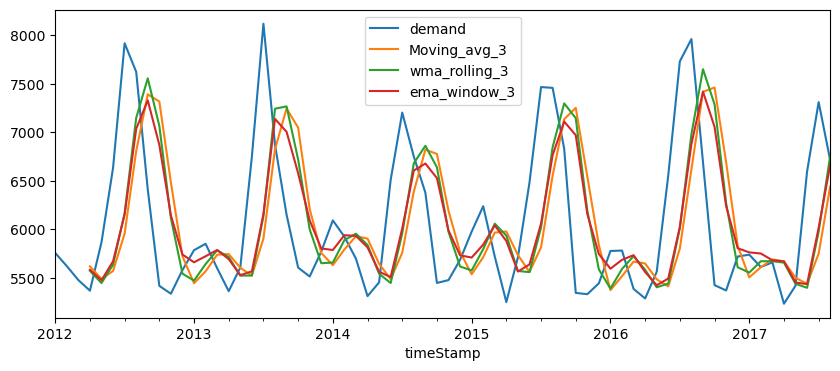

In [81]:
pm[['demand','Moving_avg_3','wma_rolling_3', 'ema_window_3']].plot()
plt.show()

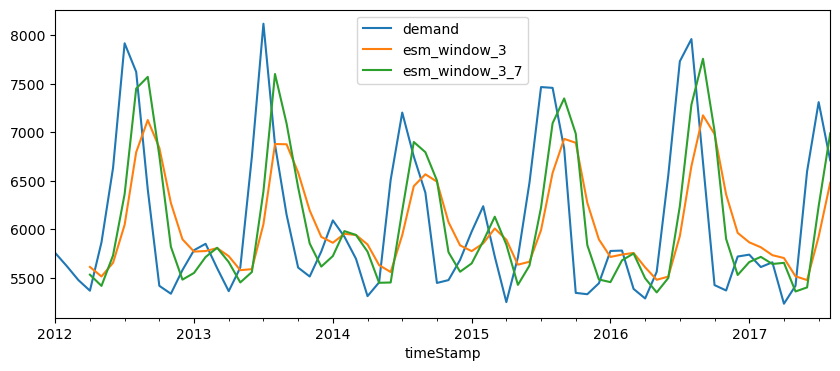

In [82]:
pm[['demand', 'esm_window_3', 'esm_window_3_7']].plot()
plt.show()

In [83]:
from sklearn.metrics import mean_squared_error, mean_absolute_error


In [84]:
pm_clean = pm.dropna(subset=['Moving_avg_3','wma_rolling_3', 'ema_window_3','esm_window_3' , 'esm_window_3_7'])

In [85]:
rmse_ma = mean_squared_error(pm_clean['demand'], pm_clean['Moving_avg_3'], squared=False)

print(f"RMSE for Moving average: {rmse_ma:.3f}")

RMSE for Moving average: 938.764


In [86]:
rmse_wma = mean_squared_error(pm_clean['demand'], pm_clean['wma_rolling_3'], squared=False)

print(f"RMSE for Weighted Moving Average: {rmse_wma:.3f}")

RMSE for Weighted Moving Average: 837.255


In [87]:
rmse_ema = mean_squared_error(pm_clean['demand'], pm_clean['ema_window_3'], squared=False)

print(f"RMSE for Exponential Moving Average: {rmse_ema:.3f}")

RMSE for Exponential Moving Average: 785.935


In [88]:
rmse_esm_1 = mean_squared_error(pm_clean['demand'], pm_clean['esm_window_3'], squared=False)

print(f"RMSE for Exponential Smoothing alpha=0.3: {rmse_esm_1:.3f}")

RMSE for Exponential Smoothing alpha=0.3: 807.541


In [89]:
rmse_esm_2 = mean_squared_error(pm_clean['demand'], pm_clean['esm_window_3_7'], squared=False)
print(f"RMSE for Exponential Smoothing alpha=0.7: {rmse_esm_2:.3f}")

RMSE for Exponential Smoothing alpha=0.7: 734.777


### Decomposing the time series 

In [91]:
decomposition = seasonal_decompose(df_1['demand'], model='additive')

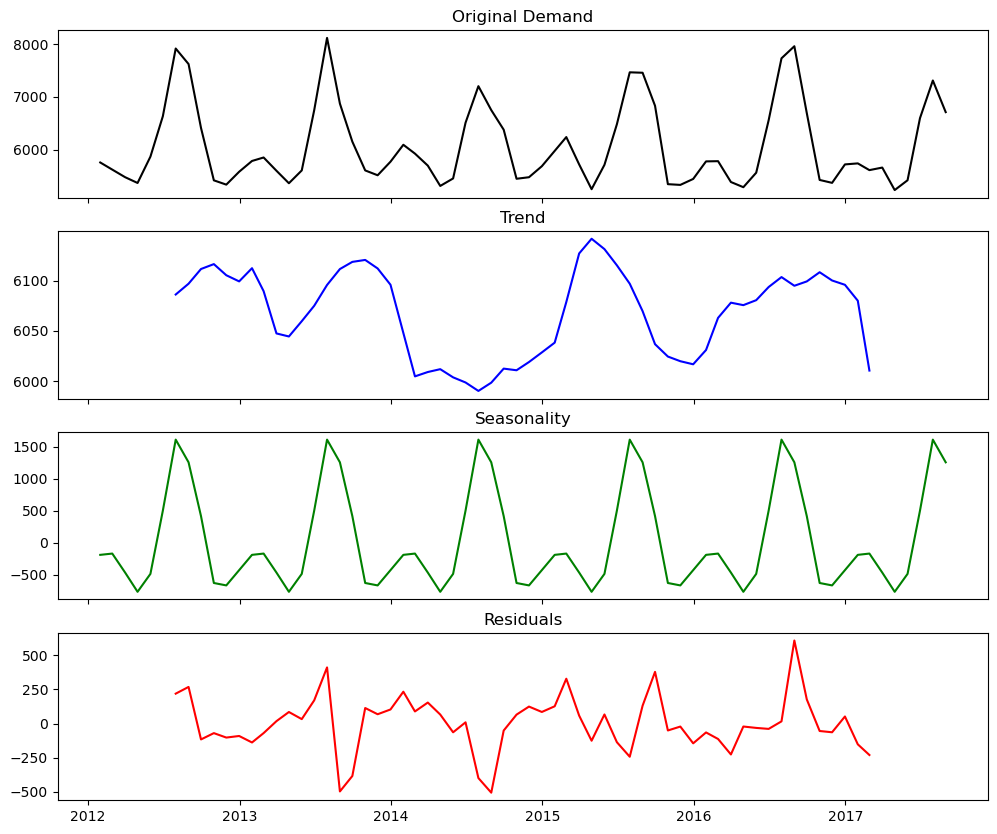

In [92]:
fig, axs = plt.subplots(4, 1, figsize=(12, 10), sharex=True)

axs[0].plot(df_1['demand'], label='Original', color='black')
axs[0].set_title('Original Demand')

axs[1].plot(decomposition.trend, label='Trend', color='blue')
axs[1].set_title('Trend')

axs[2].plot(decomposition.seasonal, label='Seasonality', color='green')
axs[2].set_title('Seasonality')

axs[3].plot(decomposition.resid, label='Residuals', color='red')
axs[3].set_title('Residuals')

plt.show()

<p><b>
  From the decomposition of monthly energy data into its components, we can observe that:
  <ul>
    <li> There is a non-linear trend, not strictly increasing or decreasing, but it changes the level of the series over time.
    <li>A strong yearly seasonal pattern is clearly visible, the demand rises and falls around the same months every year. This indicates seasonality is present.</li>
    <li>The residuals fluctuate randomly around zero, indicating that after removing the seasonal component, no remaining pattern is detectable.</li>
  </ul>
<b/></p>
<p><b> The presence of trend and seasonality indicates that the time series is not stationary, as both lead to changing statistical properties like mean and variance over time.</b></p>

### Statistical test for stationarity check

<p> The ADF test is one of the most widely used statistical tests to detect non-stationarity in time series data. It focuses on whether the data has a unit root, which is a strong sign of non-stationarity.</p>

<p>Hypotheses:

<ul>
<li>Null Hypothesis (H₀): The time series has a unit root, implies it is non-stationary.</li>

<li>Alternative Hypothesis (H₁): The time series does not have a unit root, implies it is stationary.</li>
</ul>
<p>

<p>Interpretation:
<ul>
<li>If the p-value is less than 0.05, we reject the null hypothesis, implies the series is stationary.</li>
<li>If the p-value is greater than 0.05, we fail to reject the null hypothesis, implies the series is non-stationary.</li>
</ul>
</p>

In [98]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(df_1['demand'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Number of lags used:', result[2])
print('Number of observations:', result[3])
print('Critical Values:')
for key, value in result[4].items():
    print(f' {key}: {value}')
if result[1] < 0.05:
    print("Series is Stationary")
else:
    print("Series is Non-stationary")

ADF Statistic: -2.709079671908233
p-value: 0.07248022478918364
Number of lags used: 10
Number of observations: 57
Critical Values:
 1%: -3.5506699942762414
 5%: -2.913766394626147
 10%: -2.5946240473991997
Series is Non-stationary


<p><b> ADF test suggests that time series data is not stationary.</b></p>

# Model Building

# ARIMA Model

<p>ARIMA stands for AutoRegressive Integrated Moving Average. It is a popular model used to forecast univariate time series data by capturing three key aspects:
<ul>
<li>AR (AutoRegressive) – Past values influence the current value.</li>
<li>I (Integrated) – Differencing to make the time series stationary.</li>
<li>MA (Moving Average) – Past forecast errors influence the current value.</li>
</ul>
</p>
<p> There are three parameters of ARIMA: (p,d,q)
<ul>
    <li>AR order(p) - Number of past values(lags) used in the model.</li>
    <li>Differencing order(d) - Number of times the data is differenced to make it stationarity.</li>
    <li>MA order(q) - Number of past forecast errors used. </li>
</ul>

In [103]:
#Applying seasonal differencing with lag=12 to remove the annual seasonality from the time series data
stationary_series = df_1['demand'].diff(12).dropna()

In [104]:
result = adfuller(stationary_series)
if result[1] < 0.05:
    print("Series is Stationary")
else:
    print("Series is Non-stationary")

Series is Stationary


<p><b> Applying Seasonal differencing with lag=12 is making the time series stationary.</b></p>

<p><b>SARIMA(p,d,q)(P,D,Q)[m]</b></p>


In [107]:
import pmdarima as pm

In [108]:
arima_model = pm.auto_arima(df_1['demand'], m=12, 
                            max_p=3, max_q=3, 
                            max_P=3, max_Q=3, D=1,    
                            stepwise=True, trace=True, seasonal=True,
                            error_action='ignore', suppress_warnings=True) 


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=809.052, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=804.620, Time=4.42 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=797.692, Time=1.03 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=807.453, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=801.409, Time=0.18 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=2.93 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=801.374, Time=0.68 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=inf, Time=1.55 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=803.774, Time=0.37 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=797.531, Time=1.30 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=802.293, Time=0.20 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(1,0,1)(0,1,2)[12] intercept   : AIC=inf, Time=

In [109]:
arima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                   68
Model:             SARIMAX(1, 0, 2)x(0, 1, [1], 12)   Log Likelihood                -392.123
Date:                              Mon, 11 Aug 2025   AIC                            794.246
Time:                                      22:15:38   BIC                            804.372
Sample:                                  01-31-2012   HQIC                           798.172
                                       - 08-31-2017                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9865      0.029     33.961      0.000       0.930       1.043
ma.L1         -0.4343      0.147     -2.952      0.003      -0.723      -0.146
ma.L2         -0.4066      0.123     -3.306      0.001      -0.648      -0.166
ma.S.L12      -0.8290      0.239     -3.463      0.001      -1.298      -0.360
sigma2      5.114e+04      1e+04      5.101      0.000    3.15e+04    7.08e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 3.20
Prob(Q):                              0.88   Prob(JB):                         0.20
Heteroskedasticity (H):               1.03   Skew:                             0.31
Prob(H) (two-sided):                  0.95   Kurtosis:                         3.99
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

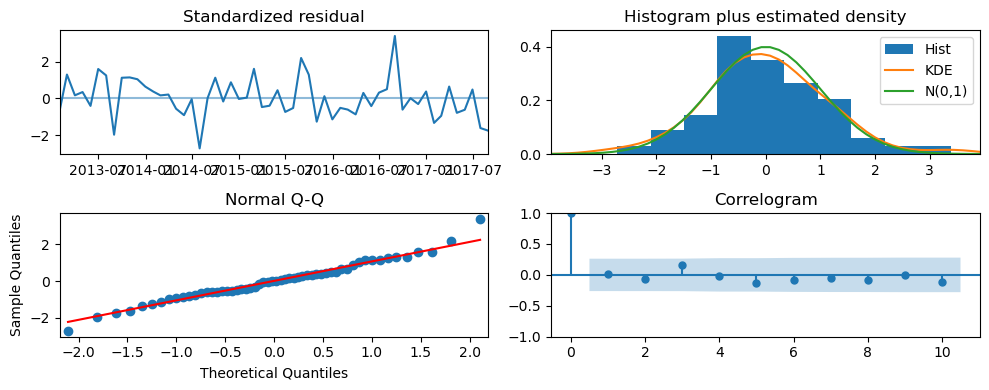

In [110]:
fig = arima_model.plot_diagnostics()
plt.tight_layout()
plt.show()

<p><strong>1. Standardized Residuals:</strong><br>
This plot displays the residuals of the model over time. Ideally, these residuals should resemble white noise i.e., randomly scattered around zero without any visible trend or repeating pattern. In the first plot, the residuals appear to be randomly distributed around the zero line, showing no consistent upward or downward trend. This suggests that the model has successfully captured the underlying trend and seasonality in the data.</p>

<p><strong>2. Histogram + KDE + Normal Distribution Curve:</strong><br>
This plot is used to check if the residuals follow a normal distribution, which is an assumption in ARIMA modeling. The histogram bars represent the distribution of residuals, the orange line shows the kernel density estimate (KDE), and the green line represents the theoretical normal distribution. In the second plot, the residuals are symmetric and bell-shaped.  This indicates that the residuals are approximately normally distributed.</p>

<p><strong>3. Q-Q Plot:</strong><br>
The Quantile-Quantile (Q-Q) plot helps to visually assess if the residuals are normally distributed by comparing their quantiles with those of a standard normal distribution. In the third plot, most of the points lie on or close to the red line, suggesting that the distribution of the residuals aligns well with a normal distribution. Overall, this plot supports the assumption of residual normality.</p>

<p><strong>4. Correlogram / ACF Plot of Residuals:</strong><br>
This plot shows the autocorrelation of residuals at different lags. For a well-fitted ARIMA model, the autocorrelations should all lie within the blue confidence interval band, except for lag 0, which always shows a value of 1. In fourth plot, all lags beyond 0 fall within the confidence bands, indicating that there is no significant autocorrelation remaining in the residuals. This confirms that the model has effectively captured the time-dependent structure in the original data.</p>

<p><strong>Conclusion:</strong><br>
The diagnostics collectively indicate that the ARIMA/SARIMA model is well-fitted.</p>

In [112]:
df_1.shape

(68, 7)

In [113]:
# Determine 80% split point
split_point = int(len(df_1.index) * 0.83)
split_date = df_1.index[split_point]

# Split data
train = df_1[df_1.index.get_level_values(0) < split_date]
test = df_1[df_1.index.get_level_values(0) >= split_date]

In [114]:
print(train.shape)
print(test.shape)

(56, 7)
(12, 7)


In [115]:
test.index

DatetimeIndex(['2016-09-30', '2016-10-31', '2016-11-30', '2016-12-31',
               '2017-01-31', '2017-02-28', '2017-03-31', '2017-04-30',
               '2017-05-31', '2017-06-30', '2017-07-31', '2017-08-31'],
              dtype='datetime64[ns]', name='timeStamp', freq='ME')

In [116]:
arima_model.fit(train['demand'])

ARIMA(order=(1, 0, 2), scoring_args={}, seasonal_order=(0, 1, 1, 12),
      suppress_warnings=True, with_intercept=False)

#### Forecasting

In [118]:
arima_forecast = arima_model.predict(n_periods=12, index=test.index, return_conf_int=True)

In [119]:
arima_forecast

(2016-09-30    7100.212788
 2016-10-31    5415.812133
 2016-11-30    5405.888427
 2016-12-31    5539.730673
 2017-01-31    5864.874275
 2017-02-28    5904.703280
 2017-03-31    5496.495221
 2017-04-30    5329.374252
 2017-05-31    5629.625260
 2017-06-30    6590.576985
 2017-07-31    7720.668407
 2017-08-31    7880.381989
 Freq: ME, dtype: float64,
 array([[6608.32053517, 7592.10504047],
        [4827.27625947, 6004.34800577],
        [4817.35113839, 5994.4257155 ],
        [4951.18968969, 6128.27165666],
        [5276.32835873, 6453.42019032],
        [5316.15582945, 6493.25073068],
        [4907.94628647, 6085.04415573],
        [4740.82383616, 5917.92466862],
        [5041.07336682, 6218.17715402],
        [6002.02361839, 7179.13035201],
        [7132.11357095, 8309.22324271],
        [7291.82568861, 8468.93829017]]))

In [120]:
forecast_df = pd.DataFrame(arima_forecast[0],  columns=['Prediction'])

In [121]:
forecast_df = pd.concat([test['demand'], forecast_df], axis=1)
forecast_df

,demand,Prediction
2016-09-30,6693.131075,7100.212788
2016-10-31,5426.440821,5415.812133
2016-11-30,5371.189944,5405.888427
2016-12-31,5720.892685,5539.730673
2017-01-31,5740.181223,5864.874275
2017-02-28,5612.557771,5904.703280
2017-03-31,5660.977832,5496.495221
2017-04-30,5234.711447,5329.374252
2017-05-31,5420.456899,5629.625260
2017-06-30,6597.990346,6590.576985


#### Model evaluation

In [123]:
#Mean Squared Error

mse_sarima = mean_squared_error(forecast_df['Prediction'], forecast_df['demand'])
print(f"MSE for SARIMA Model: {mse_sarima:.2f}")

MSE for SARIMA Model: 159489.84


In [124]:
#Root Mean Squared Error

rmse_sarima = mean_squared_error(forecast_df['Prediction'], forecast_df['demand'], squared=False)
print(f"RMSE for SARIMA Model: {rmse_sarima:.2f}")

RMSE for SARIMA Model: 399.36


In [125]:
#Mean Absolute Error

mae_sarima = mean_absolute_error(forecast_df['Prediction'], forecast_df['demand'])
print(f"MAE for SARIMA Model: {mae_sarima:.2f}")

MAE for SARIMA Model: 258.67


In [126]:
#Mean Absolute Percentage Error

mape_sarima = np.mean(np.abs((forecast_df['demand'] - forecast_df['Prediction']) / ( forecast_df['demand']))) * 100
print(f"MAPE for SARIMA model: {mape_sarima:.2f}")

MAPE for SARIMA model: 4.10


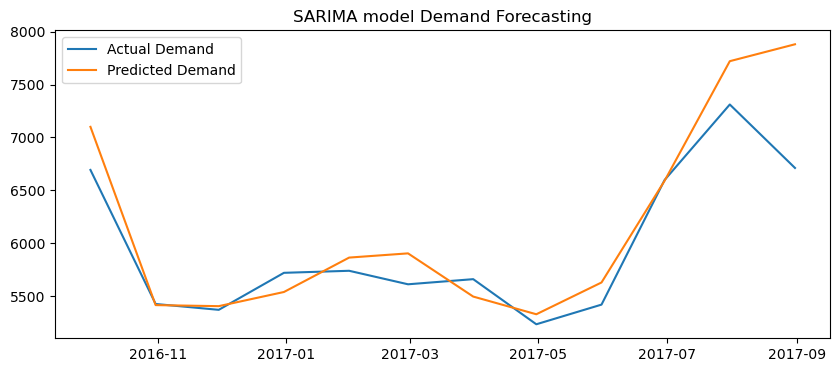

In [127]:
plt.plot(forecast_df['demand'], label='Actual Demand')
plt.plot(forecast_df['Prediction'], label='Predicted Demand')
plt.legend()
plt.title('SARIMA model Demand Forecasting')
plt.show()

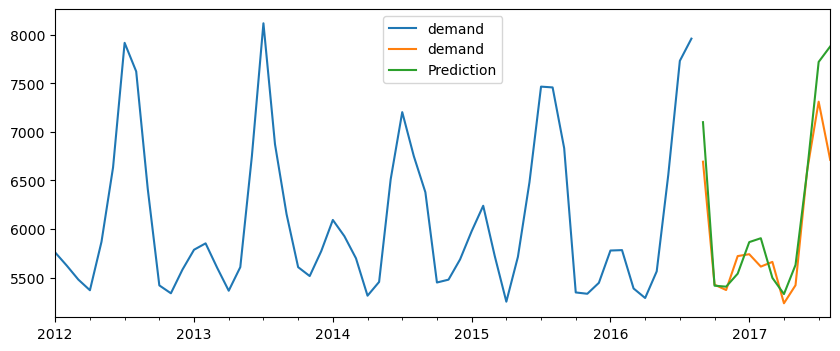

In [128]:
pd.concat([train['demand'], forecast_df],axis=1).plot()
plt.show()

In [129]:
forecast_range = pd.date_range(start='2016-09-30', periods=12, freq='M')

In [130]:
lower = pd.Series(arima_forecast[1][:,0], index=forecast_range)
upper = pd.Series(arima_forecast[1][:,1], index=forecast_range)

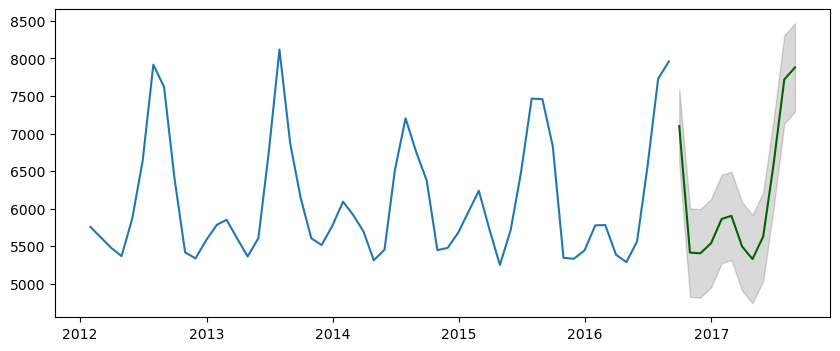

In [131]:
plt.plot(train['demand'])
plt.plot(forecast_df['Prediction'], color='darkgreen')
plt.fill_between(forecast_range, lower, upper, color='k', alpha=0.15)
plt.show()

# Random Forest

<p>Random Forest is a powerful ensemble learning method which  is traditionally used for regression and classification tasks. While it is not inherently designed for time series forecasting because it does not model sequential or temporal dependencies, but it can be effectively used to forecast time-dependent data through careful feature engineering.</p>

In [134]:
monthly_df= pd.DataFrame()
monthly_df['demand']= df_1['demand']
monthly_df.head(5)

,demand
timeStamp,
2012-01-31,5757.495833
2012-02-29,5622.331609
2012-03-31,5478.582661
2012-04-30,5368.945833
2012-05-31,5867.896102


<p>To adapt Random Forest for time series forecasting, the time series is first transformed into a supervised learning problem by creating meaningful features that help the model capture temporal patterns, seasonality, and external influences.
<ul><b>In this project, the following features were engineered:</b>
<li>Time lag features from lag 1 to lag 12.</li>
<li>Month feature.</li>
<li>Temperature feature.</li>
<li>Rolling statistics (Window = 3).</li>
</ul>
</p>

In [136]:
for lag in range(1,13):
    monthly_df[f'demand_lag_{lag}'] = monthly_df['demand'].shift(lag)

In [137]:
monthly_df['rolling_mean_3']=monthly_df['demand'].shift(1).rolling(3).mean()
monthly_df['rolling_std_3'] = monthly_df['demand'].shift(1).rolling(3).std()

In [138]:
monthly_df['month'] = monthly_df.index.month

In [139]:
monthly_df['temperature'] = df_1[['temperature']]

In [140]:
monthly_df.dropna(inplace=True)

In [141]:
train_size = int(len(monthly_df) *0.8)
X = monthly_df.drop(columns = ['demand'])
y = monthly_df['demand']

In [142]:
X.shape

(56, 16)

In [143]:
y.shape

(56,)

In [144]:
#preserve time order
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]

In [145]:
y_test.shape

(12,)

### Initial testing random forest

In [147]:
# 100 base decision trees

from sklearn.ensemble import RandomForestRegressor as RF
rf = RF(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)

In [148]:
def evaluate_model(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    train_mae = mean_absolute_error(y_train, y_train_pred)
    test_mae = mean_absolute_error(y_test, y_test_pred)
    
    train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
    test_rmse = mean_squared_error(y_test, y_test_pred, squared=False)

    train_mse = mean_squared_error(y_train, y_train_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)

    print(f"Train MAE: {train_mae:.2f} | Test MAE: {test_mae:.2f}")
    print(f"Train RMSE: {train_rmse:.2f} | Test RMSE: {test_rmse:.2f}")
    print(f"Train MSE: {train_mse:.2f} | Test MSE: {test_mse:.2f}")

In [149]:
evaluate_model(rf, X_train, y_train, X_test, y_test)

Train MAE: 58.20 | Test MAE: 114.70
Train RMSE: 75.85 | Test RMSE: 140.37
Train MSE: 5753.08 | Test MSE: 19704.29


<p><b>After comparing the performance of the model, it is evident that the model is overfitting, performing well on the training data but failing to generalize on the test data.</b></p>


### Hyperparameter tuning

In [152]:
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV

In [153]:
tscv = TimeSeriesSplit(n_splits=5)

In [154]:
#parameter space

param_grid = {'n_estimators':[100,200,300],'max_depth':[5,10],'min_samples_split':[8,10,15],'min_samples_leaf':[5,10]}


In [155]:
rf_model = RF(random_state=42)

In [156]:
grid_search = GridSearchCV(estimator = rf_model, param_grid = param_grid, cv=tscv, scoring = 'neg_mean_absolute_error',
                          verbose=1)

In [157]:
grid_search.fit(X_train, y_train)
print('Best parameters', grid_search.best_params_)
best_model = grid_search.best_estimator_

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters {'max_depth': 5, 'min_samples_leaf': 5, 'min_samples_split': 8, 'n_estimators': 300}


In [158]:
#best parameters

best_params = grid_search.best_params_
best_params

{'max_depth': 5,
 'min_samples_leaf': 5,
 'min_samples_split': 8,
 'n_estimators': 300}

In [159]:
best_model

RandomForestRegressor(max_depth=5, min_samples_leaf=5, min_samples_split=8,
                      n_estimators=300, random_state=42)

In [160]:
evaluate_model(best_model, X_train, y_train, X_test, y_test)

Train MAE: 150.82 | Test MAE: 164.39
Train RMSE: 228.45 | Test RMSE: 195.76
Train MSE: 52187.91 | Test MSE: 38322.18


<p><b>After performing hyperparameter tuning using TimeSeriesSplit and GridSearchCV, we successfully reduced the overfitting observed in the initial Random Forest model. The performance gap between training and testing errors has significantly decreased, indicating better generalization of the model to unseen data.</b></p>

### Hyperparameter tuning + Feature selection

In [163]:
importances = rf.feature_importances_
features = X_train.columns
importances_df = pd.DataFrame({'Feature': features, 'Importance':importances})
importances = importances_df.sort_values(by='Importance', ascending=False).head(5)
importances

,Feature,Importance
15,temperature,0.693268
11,demand_lag_12,0.221657
8,demand_lag_9,0.032696
9,demand_lag_10,0.008849
2,demand_lag_3,0.007362


In [164]:
selected_features = importances['Feature']
X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

In [165]:
rf_final = RF(**best_params, random_state=42)
rf_final.fit(X_train_selected, y_train)

RandomForestRegressor(max_depth=5, min_samples_leaf=5, min_samples_split=8,
                      n_estimators=300, random_state=42)

In [166]:
y_pred_reduced = rf_final.predict(X_test_selected)

In [167]:
evaluate_model(rf_final, X_train_selected, y_train, X_test_selected, y_test)

Train MAE: 150.92 | Test MAE: 157.17
Train RMSE: 229.02 | Test RMSE: 190.02
Train MSE: 52449.82 | Test MSE: 36108.92


<p><b>After performing feature engineering and hyperparameter tuning using time series-aware cross-validation, we observed a significant improvement in test performance metrics. The refined Random Forest model, which utilizes only the most important features, achieved lower MAE and RMSE on the test set compared to the original version. Therefore, we will keep this optimized model as the final version for our Random Forest model.</b></p>

#### Forecasting

In [170]:
rf_predictions = pd.DataFrame({'Demand':y_test , 'Predictions':y_pred_reduced})
rf_predictions

,Demand,Predictions
timeStamp,,
2016-09-30,6693.131075,6894.472095
2016-10-31,5426.440821,5562.627188
2016-11-30,5371.189944,5481.172415
2016-12-31,5720.892685,5773.992979
2017-01-31,5740.181223,5871.801482
2017-02-28,5612.557771,5861.103489
2017-03-31,5660.977832,5635.058602
2017-04-30,5234.711447,5421.452355
2017-05-31,5420.456899,5494.939421


#### Model Evaluation

In [172]:
#Mean squared error

mse_rf = mean_squared_error(rf_predictions['Demand'], rf_predictions['Predictions'])
print(f"MSE for Random Forest Model: {mse_rf:.2f}")

MSE for Random Forest Model: 36108.92


In [173]:
#Root mean squared error

rmse_rf = mean_squared_error(rf_predictions['Demand'], rf_predictions['Predictions'],squared=False)
print(f"RMSE for Random Forest Model: {rmse_rf:.2f}")

RMSE for Random Forest Model: 190.02


In [174]:
#Mean absolute error

mae_rf = mean_absolute_error(rf_predictions['Demand'], rf_predictions['Predictions'])
print(f"MAE for Random Forest Model: {mae_rf:.2f}")

MAE for Random Forest Model: 157.17


In [175]:
#Mean absolute percentage error

mape_rf = np.mean(np.abs((rf_predictions['Demand'] - rf_predictions['Predictions']) / (rf_predictions['Predictions']))) * 100
print(f"MAPE for Random Forest Model: {mape_rf:.2f}")

MAPE for Random Forest Model: 2.52


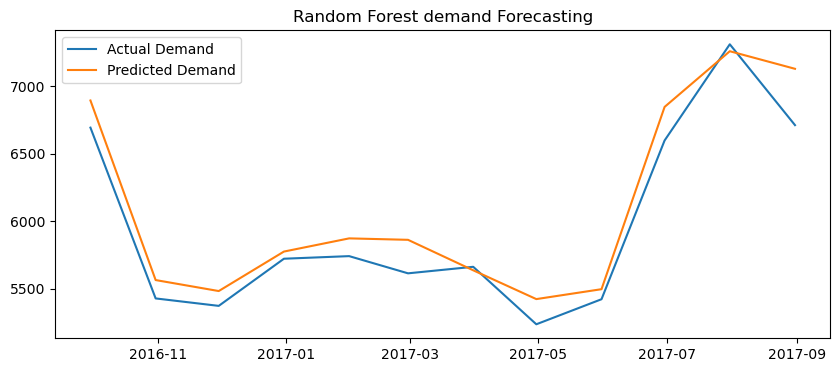

In [176]:
plt.plot(rf_predictions['Demand'], label='Actual Demand')
plt.plot(rf_predictions['Predictions'], label='Predicted Demand')
plt.legend()
plt.title('Random Forest demand Forecasting')
plt.show()

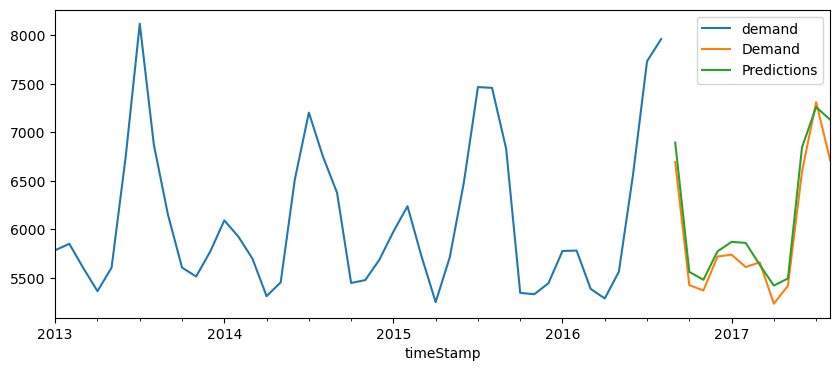

In [177]:
pd.concat([y_train, rf_predictions],axis=1).plot()
plt.show()

# LSTM model

<p>LSTM (Long Short-Term Memory) is a type of Recurrent Neural Network (RNN) that is well-suited for sequential data like time series because it can learn patterns over time while remembering long-term dependencies. It captures temporal patterns in the data such as trends, seasonality, and sudden changes by maintaining an internal memory.</p>
<p>Since LSTMs expect sequence input, we can’t just feed in a flat time series. We first need to convert the time series into supervised learning format using windowing.</p>

In [180]:
from sklearn.preprocessing import MinMaxScaler

In [181]:
#scaling the time series before feeding into the model

scaler = MinMaxScaler()
demand_scaled = scaler.fit_transform(df_1['demand'].values.reshape(-1, 1))

In [182]:
demand_scaled.shape

(68, 1)

In [183]:
def create_sequences(data, window_size):
    X, y = [], []
    for i in range(len(data) - window_size):
        X.append(data[i:i+window_size])
        y.append(data[i+window_size])
    return np.array(X), np.array(y)

In [184]:
test_size = 12

In [185]:
#Taking the window size = 12

window_size = 12
train_lstm_data = demand_scaled[:-test_size]  # first 52 values
test_lstm_data = demand_scaled[-(test_size + window_size):]  # last 24 values

X_train, y_train = create_sequences(train_lstm_data, window_size)
X_test, y_test = create_sequences(test_lstm_data, window_size)

# Reshape for LSTM
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1)) #samples, timesteps, features
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

In [186]:
len(y_test)

12

In [187]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(44, 12, 1)
(12, 12, 1)
(44, 1)
(12, 1)


In [188]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense, LeakyReLU
from keras.callbacks import EarlyStopping

In [189]:
model = Sequential()
model.add(LSTM(128, input_shape=(window_size, 1), return_sequences=True))
model.add(LeakyReLU(alpha=0.3))
model.add(Dropout(0.25))
model.add(LSTM(128, input_shape=(window_size, 1), return_sequences=False))
model.add(LeakyReLU(alpha=0.3))
model.add(Dropout(0.25))
model.add(Dense(1))

model.compile(optimizer='adam', loss='mse')

In [190]:
history = model.fit(X_train, y_train, epochs=100, shuffle=False,
                    validation_data=(X_test, y_test), verbose=1)

Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 550ms/step - loss: 0.1552 - val_loss: 0.0841
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.1173 - val_loss: 0.0601
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0846 - val_loss: 0.0617
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0707 - val_loss: 0.0836
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0842 - val_loss: 0.0643
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0747 - val_loss: 0.0551
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0723 - val_loss: 0.0544
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0748 - val_loss: 0.0541
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0753 - val_loss: 0.0530
Epoch 10/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0739 - val_loss: 0.0528
Epoch 11/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0700 - val_loss: 0.0549
Epoch 12/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0717 - va

In [191]:
y_pred = model.predict(X_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


In [192]:
y_pred_inv = scaler.inverse_transform(y_pred)
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

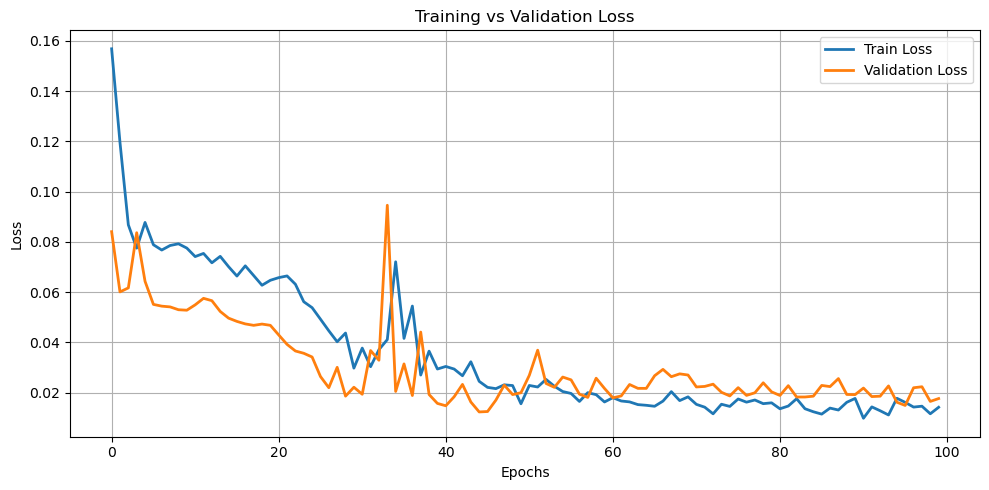

In [193]:
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [194]:
demand_pred = pd.DataFrame({'Demand':y_test_inv.reshape(-1), 'Prediction':y_pred_inv.reshape(-1)},index=test.index)
demand_pred

,Demand,Prediction
timeStamp,,
2016-09-30,6693.131075,6717.741699
2016-10-31,5426.440821,5347.290039
2016-11-30,5371.189944,5345.823730
2016-12-31,5720.892685,5407.234375
2017-01-31,5740.181223,5466.915039
2017-02-28,5612.557771,5376.023926
2017-03-31,5660.977832,5263.338379
2017-04-30,5234.711447,5253.030762
2017-05-31,5420.456899,5495.346680


In [195]:
#Mean absolute error

mae_lstm = mean_absolute_error(demand_pred['Prediction'], demand_pred['Demand'])
print(f"MAE for LSTM Model: {mae_lstm:.2f}")

MAE for LSTM Model: 248.82


In [196]:
#Mean squared error

mse_lstm = mean_squared_error(demand_pred['Prediction'], demand_pred['Demand'])
print(f"MSE for LSTM Model: {mse_lstm:.2f}")

MSE for LSTM Model: 146385.20


In [197]:
#Root mean squared error

rmse_lstm = np.sqrt(mean_squared_error(demand_pred['Prediction'], demand_pred['Demand']))
print(f"RMSE for LSTM Model: {rmse_lstm:.2f}")

RMSE for LSTM Model: 382.60


In [198]:
#Mean absolute percentage error

mape_lstm = np.mean(np.abs((demand_pred['Prediction']- demand_pred['Demand']) / (demand_pred['Demand']))) * 100
print(f"MAPE for LSTM Model: {mape_lstm:.2f}")

MAPE for LSTM Model: 4.03


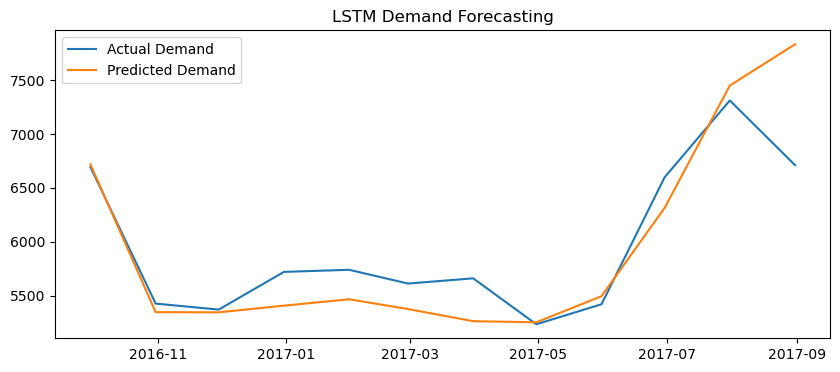

In [199]:
plt.plot(demand_pred['Demand'], label='Actual Demand')
plt.plot(demand_pred['Prediction'], label='Predicted Demand')
plt.legend()
plt.title('LSTM Demand Forecasting')
plt.show()

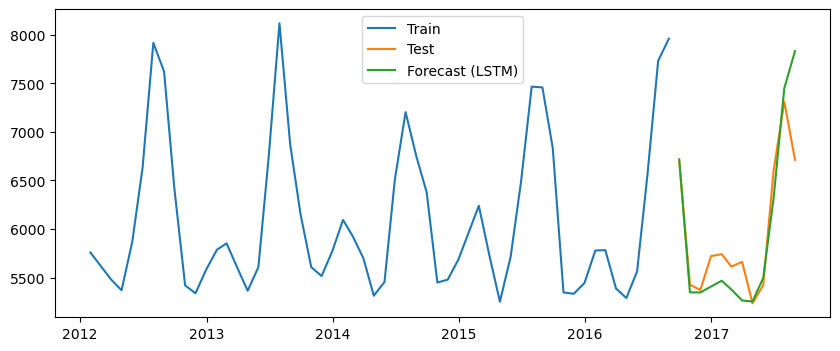

In [200]:
plt.plot(train.index, train['demand'], label='Train')
plt.plot(demand_pred.index, demand_pred['Demand'] , label='Test')
plt.plot(demand_pred.index, demand_pred['Prediction'], label='Forecast (LSTM)')
plt.legend()
plt.show()

# ETS model

<P>ETS models are a family of time series forecasting models that incorporate error, trend, and seasonality components, making them versatile for various data patterns.</P>
<p><ul>Components of ETS Models:
<li>Error(E) </li>
<li>Trend(T)  </li>
<li> Seasonality(S) </li>
</ul></p>
<p><ul>Types of ETS Models
<li>ETS(A, N, N): Simple exponential smoothing with no trend or seasonality.</li>
<li>ETS(A, A, N): Additive error, additive trend, and no seasonality.</li>
<li>ETS(M, A, M): Multiplicative error, additive trend, and multiplicative seasonality.</li>

In [203]:
from statsmodels.tsa.exponential_smoothing.ets import ETSModel

# ETS model with no trend, seasonal component only
model = ETSModel(train['demand'], error='add', trend=None, seasonal='add', seasonal_periods=12)


In [204]:
test['demand'].shape

(12,)

In [205]:
fit = model.fit()

In [206]:
#Forecast last 12 months
forecast = fit.forecast(steps=12)

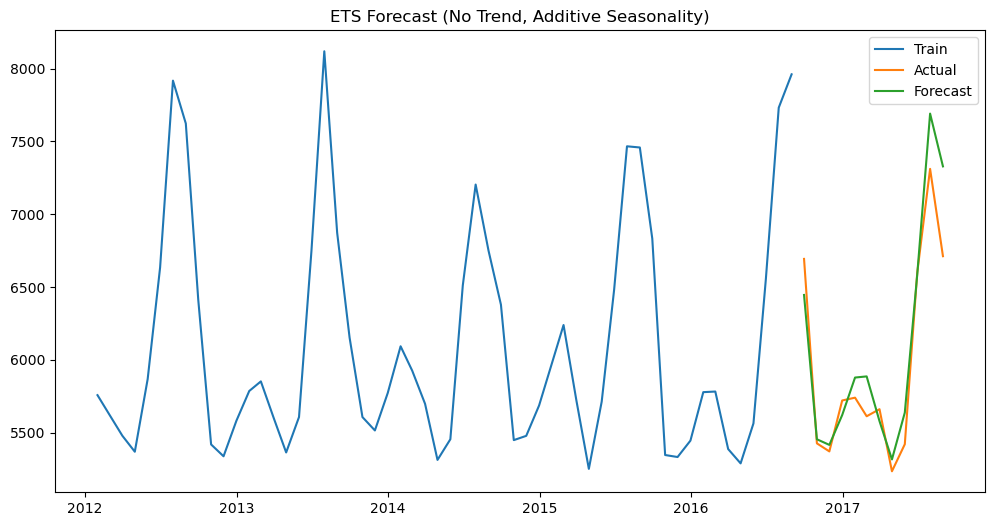

In [207]:
plt.figure(figsize=(12, 6))
plt.plot(train.index, train['demand'], label='Train')
plt.plot(test.index, test['demand'], label='Actual')
plt.plot(forecast.index, forecast, label='Forecast')
plt.title("ETS Forecast (No Trend, Additive Seasonality)")
plt.legend()
plt.show()

In [208]:
forecast_pred = pd.concat([test['demand'], forecast], axis=1)
forecast_pred.columns=['Demand', 'Predictions']
forecast_pred

,Demand,Predictions
2016-09-30,6693.131075,6445.521051
2016-10-31,5426.440821,5454.571430
2016-11-30,5371.189944,5415.923887
2016-12-31,5720.892685,5620.763132
2017-01-31,5740.181223,5878.363453
2017-02-28,5612.557771,5886.208689
2017-03-31,5660.977832,5578.956127
2017-04-30,5234.711447,5316.155023
2017-05-31,5420.456899,5637.526017
2017-06-30,6597.990346,6585.800811


In [209]:
#Mean absolute error

mae_ets = mean_absolute_error(forecast_pred['Demand'], forecast_pred['Predictions'])
print(f"MAE for ETS model: {mae_ets:.2f}")

MAE for ETS model: 185.11


In [210]:
#Root mean squared error

rmse_ets = mean_squared_error(forecast_pred['Demand'], forecast_pred['Predictions'], squared=False)
print(f"RMSE for ETS model: {rmse_ets:.2f}")

RMSE for ETS model: 250.50


In [211]:
#Mean squared error

mse_ets= mean_squared_error(forecast_pred['Demand'], forecast_pred['Predictions'])
print(f"MSE for ETS model: {mse_ets:.2f}")

MSE for ETS model: 62750.98


In [212]:
#Mean absolute percentage error

mape_ets = np.mean(np.abs((forecast_pred['Demand']- forecast_pred['Predictions']) / (forecast_pred['Predictions']))) * 100
print(f"MAPE for ETS model: {mape_ets:.2f}")

MAPE for ETS model: 2.86


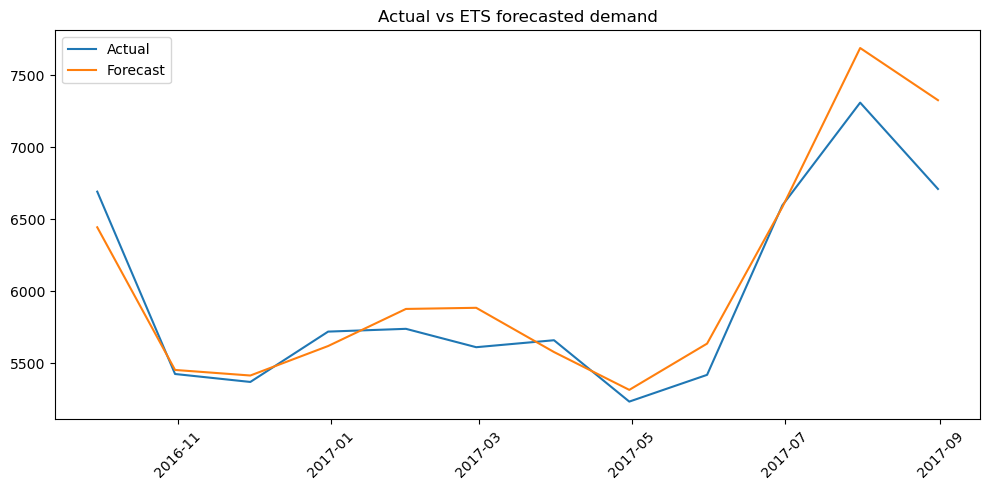

In [213]:
plt.figure(figsize=(10, 5))
plt.plot(forecast_pred.index, forecast_pred['Demand']  , label='Actual')
plt.plot(forecast_pred.index, forecast_pred['Predictions'], label='Forecast')
plt.legend()
plt.xticks(rotation=45)
plt.title("Actual vs ETS forecasted demand")
plt.tight_layout()
plt.show()

In [214]:
forecast_pred = pd.concat([test['demand'], forecast], axis=1)
forecast_pred.columns=['Demand', 'Predictions']
forecast_pred

,Demand,Predictions
2016-09-30,6693.131075,6445.521051
2016-10-31,5426.440821,5454.571430
2016-11-30,5371.189944,5415.923887
2016-12-31,5720.892685,5620.763132
2017-01-31,5740.181223,5878.363453
2017-02-28,5612.557771,5886.208689
2017-03-31,5660.977832,5578.956127
2017-04-30,5234.711447,5316.155023
2017-05-31,5420.456899,5637.526017
2017-06-30,6597.990346,6585.800811


# Comparison of all the models

In [216]:
final_predictions = pd.DataFrame({'Demand': forecast_pred['Demand'], 'ARIMA predictions':forecast_df['Prediction'],
'Random Forest Predictions':rf_predictions['Predictions'], 'LSTM predictions': demand_pred['Prediction'], 
'ETS predictions':forecast_pred['Predictions']})

final_predictions


,Demand,ARIMA predictions,Random Forest Predictions,LSTM predictions,ETS predictions
2016-09-30,6693.131075,7100.212788,6894.472095,6717.741699,6445.521051
2016-10-31,5426.440821,5415.812133,5562.627188,5347.290039,5454.571430
2016-11-30,5371.189944,5405.888427,5481.172415,5345.823730,5415.923887
2016-12-31,5720.892685,5539.730673,5773.992979,5407.234375,5620.763132
2017-01-31,5740.181223,5864.874275,5871.801482,5466.915039,5878.363453
2017-02-28,5612.557771,5904.703280,5861.103489,5376.023926,5886.208689
2017-03-31,5660.977832,5496.495221,5635.058602,5263.338379,5578.956127
2017-04-30,5234.711447,5329.374252,5421.452355,5253.030762,5316.155023
2017-05-31,5420.456899,5629.625260,5494.939421,5495.346680,5637.526017
2017-06-30,6597.990346,6590.576985,6846.826311,6314.768066,6585.800811


In [381]:
results = pd.DataFrame({ 'RMSE':[rmse_sarima, rmse_rf,  rmse_lstm],
                       'MAE':[mae_sarima,  mae_rf,  mae_lstm], 'MAPE':[mape_sarima,  mape_rf,  mape_lstm]},
                       index=['SARIMA model', 'Random Forest','LSTM model'])
                                                                                    
results

,RMSE,MAE,MAPE
SARIMA model,399.361793,258.673905,4.096961
Random Forest,190.023463,157.172439,2.520076
LSTM model,382.603194,248.815227,4.032997


<p><b>After evaluating the performance of all four models using RMSE (Root Mean Squared Error), MAE (Mean Absolute Error), and MAPE (Mean Absolute Percentage Error), the Random Forest model clearly outperforms the others across all three metrics:</p></b>
<ul>
<li><b>It has the lowest RMSE (190.02), indicating the smallest average deviation from actual values.</b></li>
<li><b>It shows the lowest MAE (157.17), confirming it makes the least absolute errors on average.</b></li>
<li><b>It also achieves the lowest MAPE (2.52%), meaning its percentage error is minimal and consistent.</b></li>
</ul></p>

<p><b>Given its superior results, we have selected the Random Forest model for deployment. Its strong predictive capability, reliability, and low error rates make it the most suitable choice for our time series forecasting application.</b></p>

# Deployment

In [221]:
import pickle

# Save model
with open('rf_model.pkl', 'wb') as f:
    pickle.dump(rf_final, f)

# Save selected features
with open('selected_features.pkl', 'wb') as f:
    pickle.dump(list(selected_features), f)